In [1]:
import os
import random
import warnings
import numpy as np
import json
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from tqdm import tqdm
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import AutoImageProcessor, DeformableDetrForObjectDetection
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

warnings.filterwarnings("ignore", message=".*copying from a non-meta parameter.*")
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.mps.is_available() else "cpu"
)
print(device)

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.cuda.manual_seed_all(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

2025-04-26 06:00:11.818946: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745647211.990513      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745647212.039762      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


cuda


In [2]:
class FoggyCityscapesDataset(Dataset):
    def __init__(self, root, annotations_path, processor):
        self.root = root
        self.coco_annotations = COCO(annotations_path)
        self.processor = processor
        self.img_ids = list(self.coco_annotations.imgs.keys())
        self.img_to_path = {
            id: os.path.join(root, self.coco_annotations.loadImgs(id)[0]["file_name"])
            for id in self.img_ids
        }

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        image_id = self.img_ids[idx]
        path = self.img_to_path[image_id]
        image = np.array(Image.open(path).convert("RGB"))
        processed = {}
        processed["image_id"] = image_id
        processed["orig_image"] = image
        processed["processed_img"] = self.processor(
            images=np.array(image), return_tensors="pt"
        )["pixel_values"].squeeze(0)

        return processed

In [3]:
def plot_predictions(orig_image, gt, output, id_to_cat):
    orig_image_cpu = orig_image.detach().cpu()

    fig, axs = plt.subplots(3, 1, figsize=(8, 12))
    axs[0].imshow(orig_image_cpu)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(orig_image_cpu)
    axs[1].set_title("Ground Truth Boxes")
    axs[1].axis("off")
    for label, box in zip(gt["labels"], gt["boxes"]):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="green",
            facecolor="none",
        )
        axs[1].add_patch(rect)
        axs[1].text(
            xmin,
            ymin - 5,
            f"GT: {id_to_cat[label]}",
            fontsize=10,
            color="blue",
            bbox=dict(facecolor="white", alpha=0.5),
        )

    axs[2].imshow(orig_image)
    axs[2].set_title("Predicted Boxes")
    axs[2].axis("off")

    for score, label, box in zip(output["scores"], output["labels"], output["boxes"]):
        score = score.detach().cpu()
        label = label.detach().cpu()
        box = box.detach().cpu()

        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )
        axs[2].add_patch(rect)
        axs[2].text(
            xmin,
            ymin - 5,
            f"{id_to_cat[label.item()]}: {round(score.item(), 2)}",
            fontsize=10,
            color="red",
            bbox=dict(facecolor="white", alpha=0.5),
        )

    plt.tight_layout()
    plt.show()

In [4]:
def remap_and_filter_predictions(pred_dict, label_map):
    labels = pred_dict["labels"]
    keep_indices = torch.tensor(
        [i for i, label in enumerate(labels.tolist()) if label in label_map],
        device=labels.device,
        dtype=torch.long,
    )

    if keep_indices.numel() == 0:
        return {
            "scores": torch.empty(
                0, device=labels.device, dtype=pred_dict["scores"].dtype
            ),
            "labels": torch.empty(0, device=labels.device, dtype=torch.long),
            "boxes": torch.empty(
                (0, 4), device=labels.device, dtype=pred_dict["boxes"].dtype
            ),
        }

    filtered_scores = pred_dict["scores"][keep_indices]
    filtered_labels = pred_dict["labels"][keep_indices]
    filtered_boxes = pred_dict["boxes"][keep_indices]

    remapped_labels = torch.tensor(
        [label_map[int(label.item())] for label in filtered_labels],
        device=filtered_labels.device,
    )

    return {
        "scores": filtered_scores,
        "labels": remapped_labels,
        "boxes": filtered_boxes,
    }

In [5]:
def summarise_and_plot_metrics(coco, coco_dt, save_dir):
    coco_eval = COCOeval(coco, coco_dt, iouType="bbox")
    coco_eval.evaluate()
    coco_eval.accumulate()

    os.makedirs(save_dir, exist_ok=True)

    print("\n### COCO Evaluation Summary ###")
    coco_eval.summarize()

    overall_metrics = {
        "AP@[IoU=0.50:0.95]": coco_eval.stats[0],
        "AP@0.50": coco_eval.stats[1],
        "AP@0.75": coco_eval.stats[2],
        "AP (small)": coco_eval.stats[3],
        "AP (medium)": coco_eval.stats[4],
        "AP (large)": coco_eval.stats[5],
        "AR@1": coco_eval.stats[6],
        "AR@10": coco_eval.stats[7],
        "AR@100": coco_eval.stats[8],
        "AR (small)": coco_eval.stats[9],
        "AR (medium)": coco_eval.stats[10],
        "AR (large)": coco_eval.stats[11],
    }

    print("\n### Overall COCO Evaluation Metrics ###")
    for metric, value in overall_metrics.items():
        print(f"{metric:20s}: {value:.3f}")

    pd.DataFrame([overall_metrics]).to_csv(
        os.path.join(save_dir, "overall_metrics.csv"), index=False
    )

    precisions = coco_eval.eval["precision"]
    recall_vals = coco_eval.params.recThrs
    cat_ids = coco.getCatIds()

    full_metrics = []
    all_pr_tables = []
    overall_pr = []

    print("\n### Per-Class AP Metrics ###")
    for idx, catId in enumerate(cat_ids):
        class_metrics = {}
        cat_name = coco.loadCats(catId)[0]["name"]
        class_metrics["category"] = cat_name

        p50 = precisions[0, :, idx, 0, 2]
        p50 = p50[p50 > -1]
        class_metrics["AP@0.50"] = np.mean(p50) if p50.size else float("nan")

        p75 = precisions[5, :, idx, 0, 2]
        p75 = p75[p75 > -1]
        class_metrics["AP@0.75"] = np.mean(p75) if p75.size else float("nan")

        p_all = precisions[:, :, idx, 0, 2]
        p_all = p_all[p_all > -1]
        class_metrics["mAP@[.5:.95]"] = np.mean(p_all) if p_all.size else float("nan")

        full_metrics.append(class_metrics)

        print(
            f"{cat_name:20s} | AP@0.5: {class_metrics['AP@0.50']:.3f} | "
            f"AP@0.75: {class_metrics['AP@0.75']:.3f} | "
            f"mAP@[.5:.95]: {class_metrics['mAP@[.5:.95]']:.3f}"
        )

        pr_curve = precisions[0, :, idx, 0, 2]
        if np.any(pr_curve > -1):
            overall_pr.append(np.where(pr_curve == -1, 0, pr_curve))

        # Collect PR table data
        for r, p in zip(recall_vals, pr_curve):
            if p > -1:
                all_pr_tables.append(
                    {"category": cat_name, "recall": r, "precision": p}
                )

        # Plot PR curve for this class
        valid = pr_curve > -1
        plt.figure()
        plt.plot(
            recall_vals[valid],
            pr_curve[valid],
            label=f"PR Curve - {cat_name}",
            color="blue",
        )
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title(f"PR Curve @ IoU=0.5 for {cat_name}")
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(
            os.path.join(save_dir, f"pr_curve_{cat_name.replace(' ', '_')}.png")
        )
        plt.show()
        plt.close()

    # Save per-class metrics
    df_metrics = pd.DataFrame(full_metrics)
    df_metrics.to_csv(os.path.join(save_dir, "per_class_metrics.csv"), index=False)

    # Plot mAP per class bar chart
    plt.figure(figsize=(12, 6))
    plt.bar(df_metrics["category"], df_metrics["mAP@[.5:.95]"], color="skyblue")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("mAP@[.5:.95]")
    plt.title("Mean Average Precision per Class")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "mAP_per_class.png"))
    plt.show()
    plt.close()

    # Save full precision-recall table to CSV
    pr_df = pd.DataFrame(all_pr_tables)
    pr_df.to_csv(os.path.join(save_dir, "precision_recall_table.csv"), index=False)

    # Overall PR Curve
    if overall_pr:
        overall_pr_array = np.array(overall_pr)
        mean_pr_curve = np.mean(overall_pr_array, axis=0)

        # Plot overall PR curve
        plt.figure(figsize=(8, 6))
        plt.plot(
            recall_vals,
            mean_pr_curve,
            color="darkorange",
            label="Overall PR Curve (IoU=0.5)",
        )
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("Overall Precision-Recall Curve @ IoU=0.5")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, "overall_pr_curve.png"))
        plt.show()
        plt.close()

        # Plot PR curves for all classes in one figure
        plt.figure(figsize=(10, 7))
        for idx, pr_curve in enumerate(overall_pr_array):
            cat_name = coco.loadCats(cat_ids[idx])[0]["name"]
            valid = pr_curve > -1
            plt.plot(recall_vals[valid], pr_curve[valid], label=cat_name, linewidth=1.5)
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("PR Curves for All Classes @ IoU=0.5")
        plt.legend(
            loc="best", fontsize="small", bbox_to_anchor=(1.05, 1), borderaxespad=0.0
        )
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(
            os.path.join(save_dir, "all_classes_pr_curve.png"), bbox_inches="tight"
        )
        plt.show()
        plt.close()

    # Plot AP@0.50 and AP@0.75 side-by-side per class
    plt.figure(figsize=(14, 6))
    x = np.arange(len(df_metrics))
    width = 0.35

    plt.bar(
        x - width / 2, df_metrics["AP@0.50"], width, label="AP@0.50", color="lightgreen"
    )
    plt.bar(
        x + width / 2, df_metrics["AP@0.75"], width, label="AP@0.75", color="salmon"
    )

    plt.xticks(ticks=x, labels=df_metrics["category"], rotation=45, ha="right")
    plt.ylabel("Average Precision")
    plt.title("AP@0.50 vs AP@0.75 per Class")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AP50_vs_AP75_per_class.png"))
    plt.show()
    plt.close()

    # Object-size AP bar chart
    size_ap_labels = ["small", "medium", "large"]
    size_ap_values = [
        overall_metrics["AP (small)"],
        overall_metrics["AP (medium)"],
        overall_metrics["AP (large)"],
    ]

    plt.figure(figsize=(6, 5))
    plt.bar(size_ap_labels, size_ap_values, color="orchid")
    plt.title("AP by Object Size")
    plt.ylabel("Average Precision")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AP_by_object_size.png"))
    plt.show()
    plt.close()

    maxDets = ["AR@1", "AR@10", "AR@100"]
    ar_values = [
        overall_metrics["AR@1"],
        overall_metrics["AR@10"],
        overall_metrics["AR@100"],
    ]

    plt.figure(figsize=(6, 5))
    plt.plot(maxDets, ar_values, marker="o", linestyle="-", color="dodgerblue")
    plt.title("Average Recall vs Max Detections")
    plt.ylabel("Average Recall")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AR_vs_max_detections.png"))
    plt.show()
    plt.close()

    print("\n### Overall PR Curves at Multiple IoU Thresholds ###")

    iou_thresholds = coco_eval.params.iouThrs
    all_pr_curves = []

    plt.figure(figsize=(10, 6))

    for i, iou in enumerate(iou_thresholds):
        pr_iou = precisions[i, :, :, 0, 2]
        pr_iou = np.where(pr_iou == -1, 0, pr_iou)
        mean_pr = np.mean(pr_iou, axis=1)

        all_pr_curves.append(mean_pr)
        plt.plot(recall_vals, mean_pr, label=f"IoU={iou:.2f}", linewidth=1.5)

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Overall PR Curves @ Varying IoU Thresholds")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "pr_curves_multiple_ious.png"))
    plt.show()
    plt.close()

In [6]:
def inference(model, dataloader, processor, id_to_cat, save_path):
    coco = dataloader.dataset.coco_annotations

    model_id_to_cat_id = {
        k: cat_id
        for k, cat_id in model.config.id2label.items()
        if cat_id in id_to_cat.values()
    }

    label_map = {}
    for model_id, cat_name in model_id_to_cat_id.items():
        for cat_id, name in id_to_cat.items():
            if name == cat_name:
                label_map[int(model_id)] = cat_id
                break

    coco_predictions = []
    visualize = True
    num_visualize = 4
    num_visualize_done = 0

    for batch in tqdm(dataloader, desc="Running inference"):
        processed_images = batch["processed_img"].to(device)
        orig_images = batch["orig_image"]
        image_ids = batch["image_id"]

        pre_outputs = model(pixel_values=processed_images)

        postprocessed_outputs = processor.post_process_object_detection(
            pre_outputs,
            target_sizes=torch.tensor(
                [img.shape[:2] for img in orig_images], device=pre_outputs.logits.device
            ),
            threshold=0.5,
        )

        for i, image_id in enumerate(image_ids):
            output = postprocessed_outputs[i]
            output = remap_and_filter_predictions(output, label_map)

            for score, label, box in zip(
                output["scores"], output["labels"], output["boxes"]
            ):
                coco_predictions.append(
                    {
                        "image_id": int(image_id),
                        "category_id": int(label),
                        "bbox": [
                            float(box[0]),
                            float(box[1]),
                            float(box[2] - box[0]),
                            float(box[3] - box[1]),
                        ],
                        "score": float(score),
                    }
                )

            if visualize and num_visualize_done < num_visualize:
                num_visualize_done += 1
                gt_annotations = coco.loadAnns(coco.getAnnIds(imgIds=image_id.item()))

                if not gt_annotations:
                    continue

                gt_labels = [ann["category_id"] for ann in gt_annotations]
                gt_boxes = [
                    [
                        ann["bbox"][0],
                        ann["bbox"][1],
                        ann["bbox"][0] + ann["bbox"][2],
                        ann["bbox"][1] + ann["bbox"][3],
                    ]
                    for ann in gt_annotations
                ]
                gt = {"labels": gt_labels, "boxes": gt_boxes}

                plot_predictions(orig_images[i], gt, output, id_to_cat)

    with open(save_path, "w") as f:
        json.dump(coco_predictions, f)

In [7]:
processor = AutoImageProcessor.from_pretrained("SenseTime/deformable-detr")
model = DeformableDetrForObjectDetection.from_pretrained("SenseTime/deformable-detr")
model = model.to(device)

preprocessor_config.json:   0%|          | 0.00/305 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


config.json:   0%|          | 0.00/4.54k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/161M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at SenseTime/deformable-detr were not used when initializing DeformableDetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [8]:
train_dataset = FoggyCityscapesDataset(
    root="/kaggle/input/foggy-cityscapes/dataset/foggy_dataset_A3_train",
    annotations_path="/kaggle/input/foggy-cityscapes/dataset/annotations_train.json",
    processor=processor,
)

val_dataset = FoggyCityscapesDataset(
    root="/kaggle/input/foggy-cityscapes/dataset/foggy_dataset_A3_val",
    annotations_path="/kaggle/input/foggy-cityscapes/dataset/annotations_val.json",
    processor=processor,
)

loading annotations into memory...
Done (t=7.27s)
creating index...
index created!
loading annotations into memory...
Done (t=2.64s)
creating index...
index created!


In [9]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

In [10]:
train_coco_gt = train_dataset.coco_annotations
val_coco_gt = val_dataset.coco_annotations
valid_cat_ids = set(val_coco_gt.getCatIds())
categories = val_coco_gt.loadCats(valid_cat_ids)
id_to_cat = {cat["id"]: cat["name"] for cat in categories}


--- Evaluating on training set ---


Running inference:   0%|          | 0/297 [00:00<?, ?it/s]

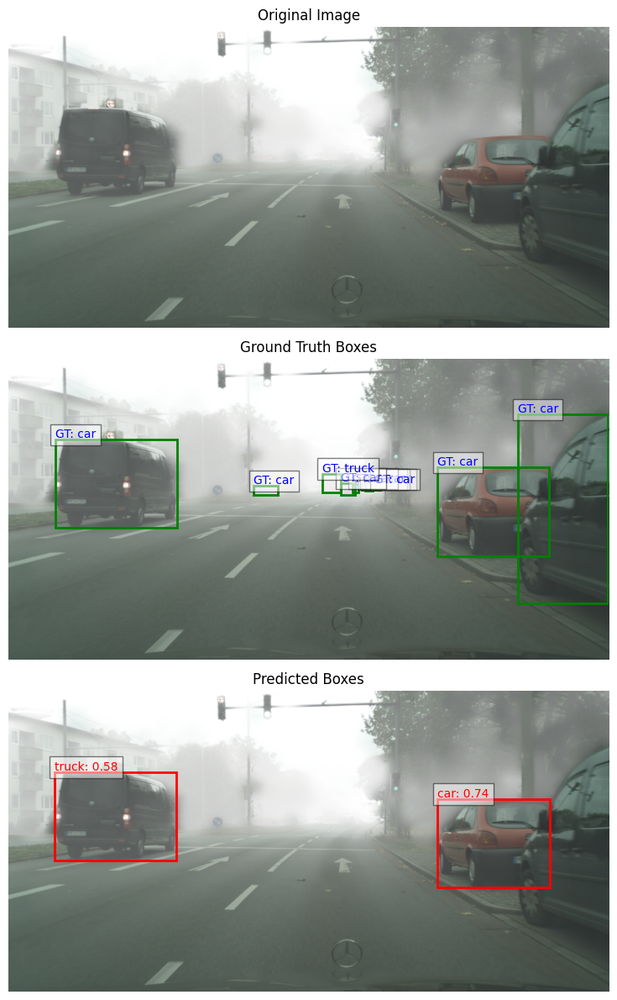

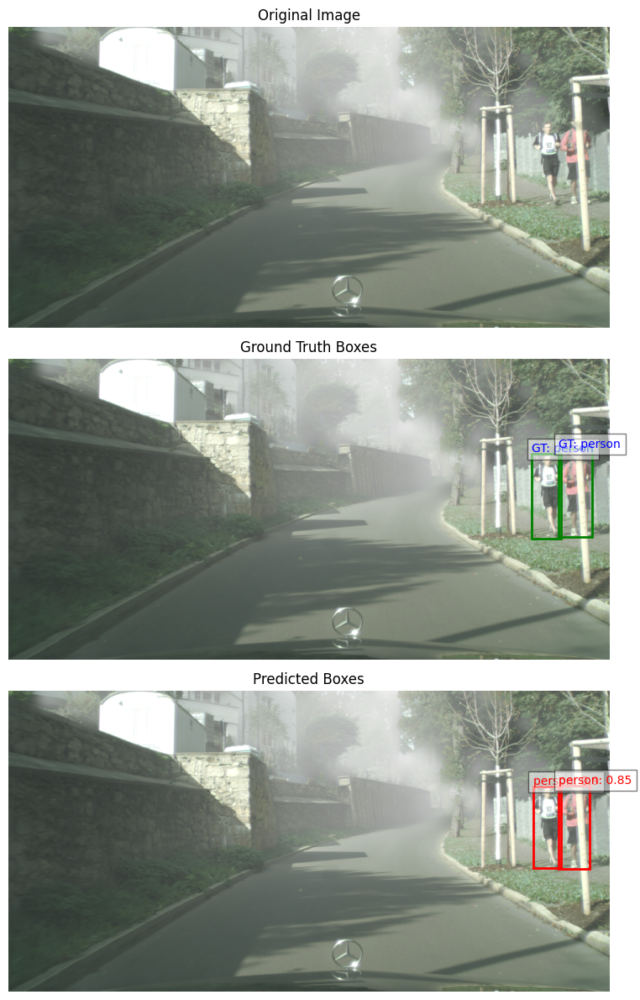

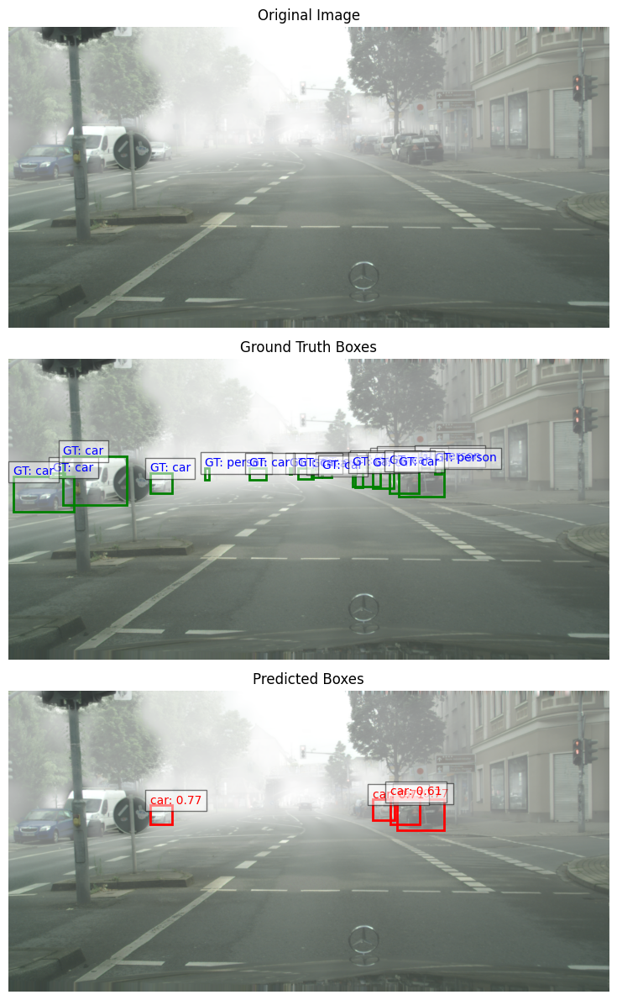

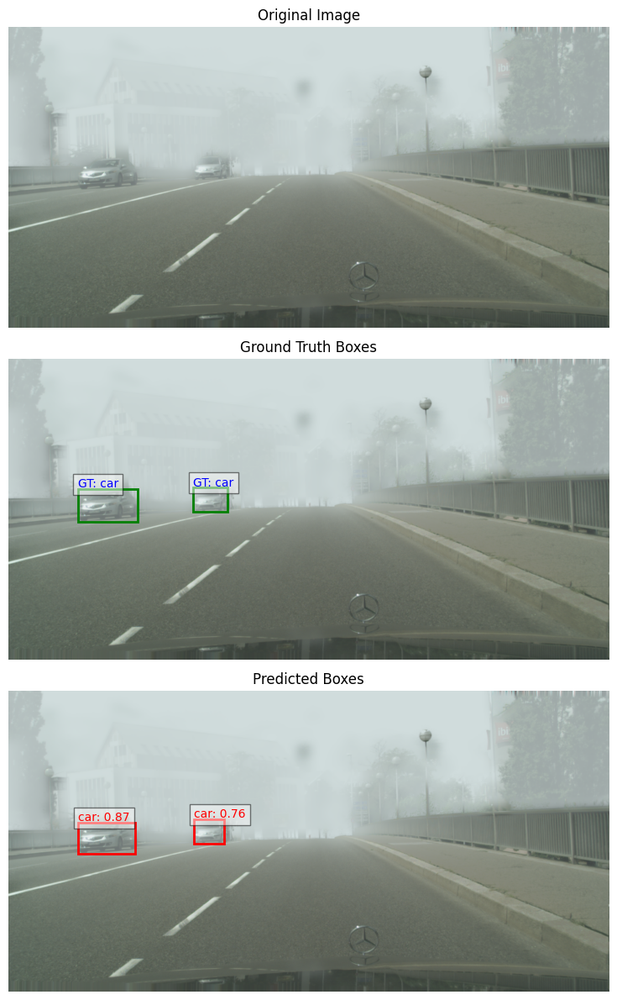

Running inference: 100%|██████████| 297/297 [12:58<00:00,  2.62s/it]


In [11]:
print("\n--- Evaluating on training set ---")
train_save_path = "train_predictions.json"
model.eval()
with torch.no_grad():
    train_eval = inference(model, train_loader, processor, id_to_cat, train_save_path)

Loading and preparing results...
DONE (t=0.06s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=5.63s).
Accumulating evaluation results...
DONE (t=0.52s).

### COCO Evaluation Summary ###
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.119
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.184
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.123
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.096
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.305
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.097
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.156
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.156
 Average Recall     (AR) @[ IoU=0.5

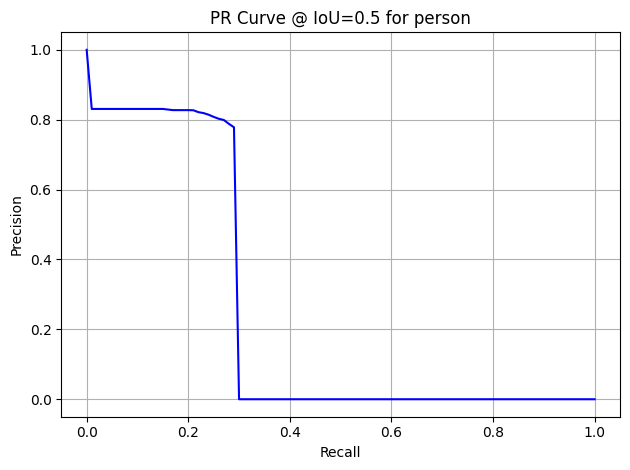

car                  | AP@0.5: 0.380 | AP@0.75: 0.329 | mAP@[.5:.95]: 0.287


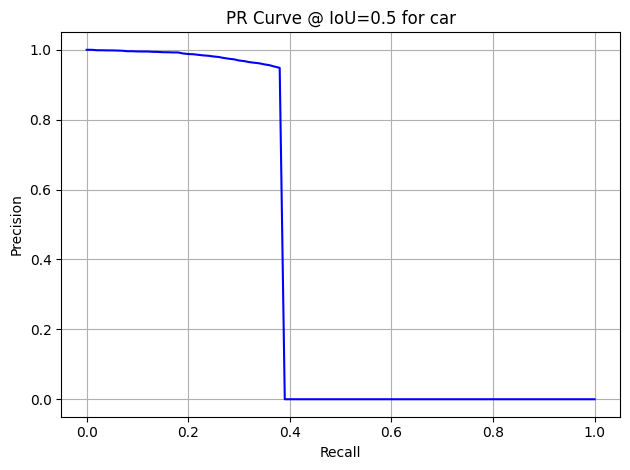

train                | AP@0.5: 0.067 | AP@0.75: 0.038 | mAP@[.5:.95]: 0.043


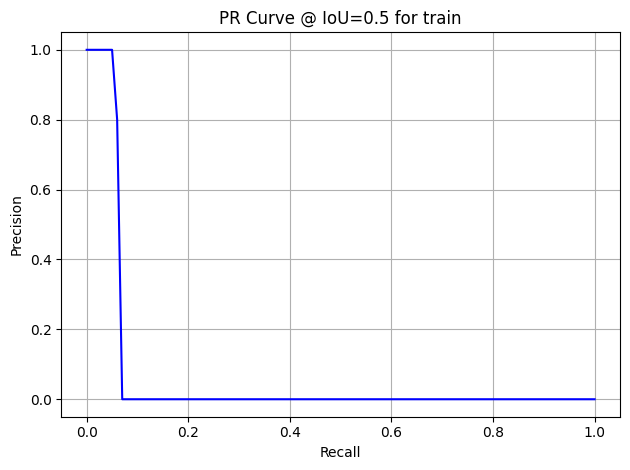

rider                | AP@0.5: 0.000 | AP@0.75: 0.000 | mAP@[.5:.95]: 0.000


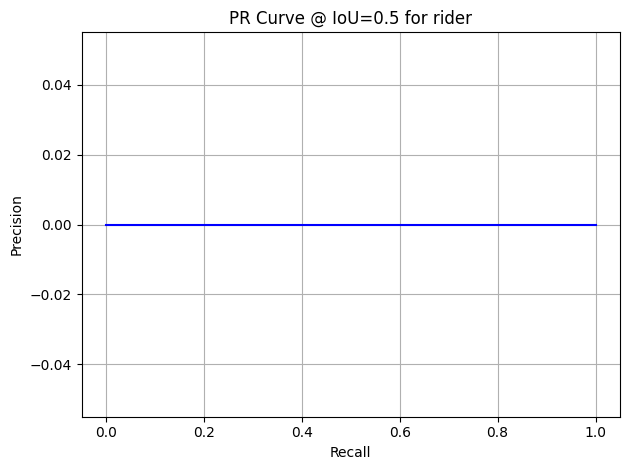

truck                | AP@0.5: 0.105 | AP@0.75: 0.100 | mAP@[.5:.95]: 0.084


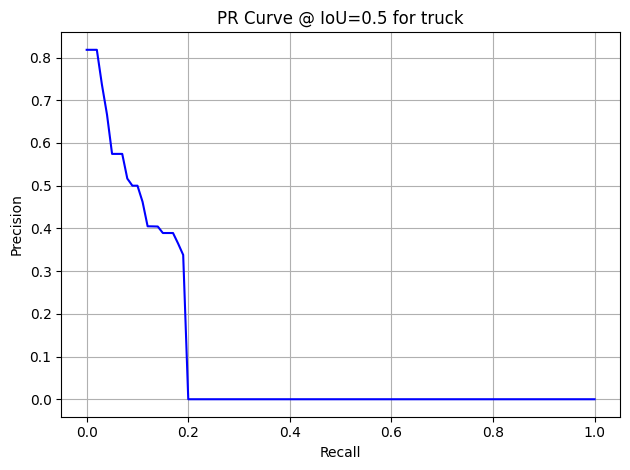

motorcycle           | AP@0.5: 0.234 | AP@0.75: 0.063 | mAP@[.5:.95]: 0.103


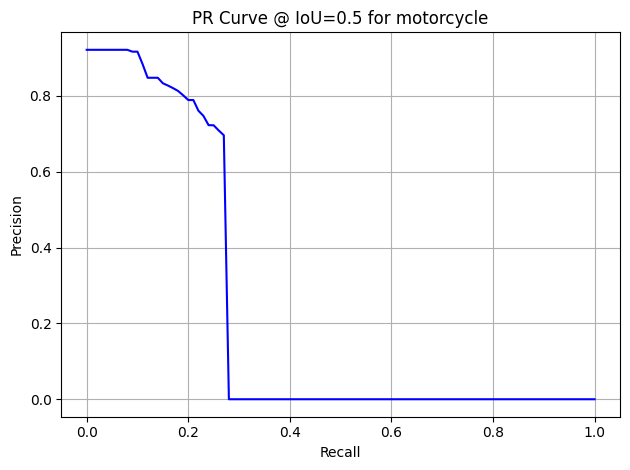

bicycle              | AP@0.5: 0.208 | AP@0.75: 0.082 | mAP@[.5:.95]: 0.102


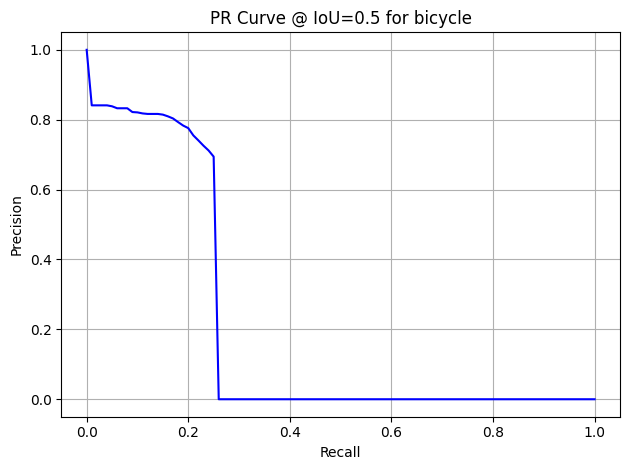

bus                  | AP@0.5: 0.229 | AP@0.75: 0.205 | mAP@[.5:.95]: 0.176


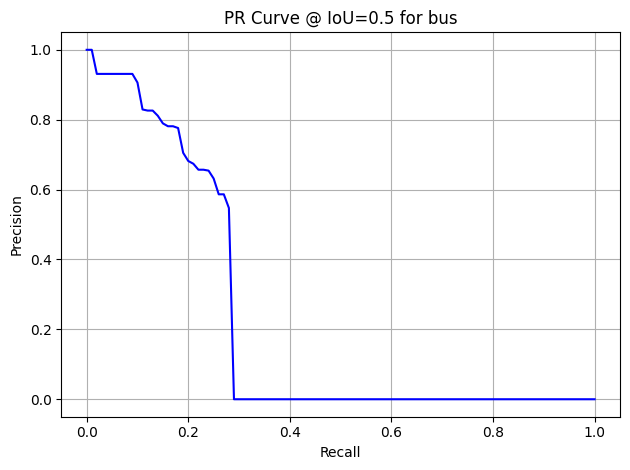

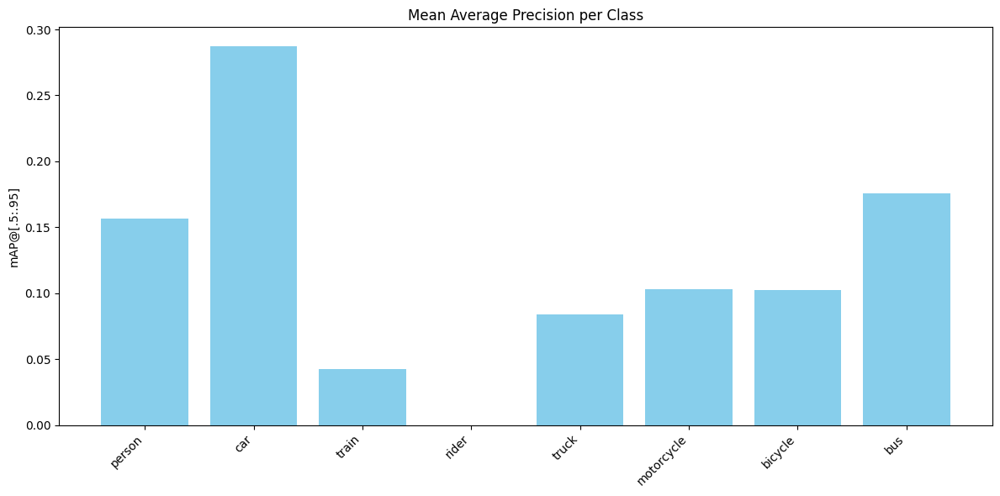

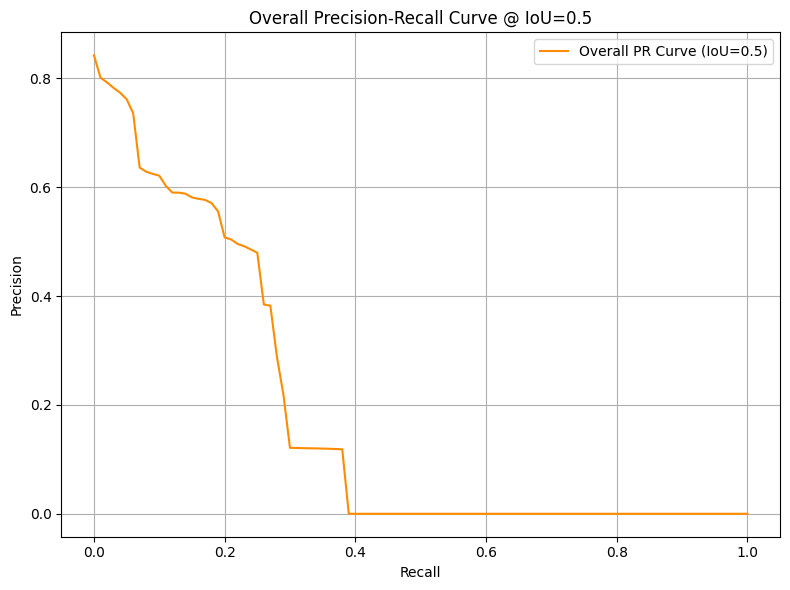

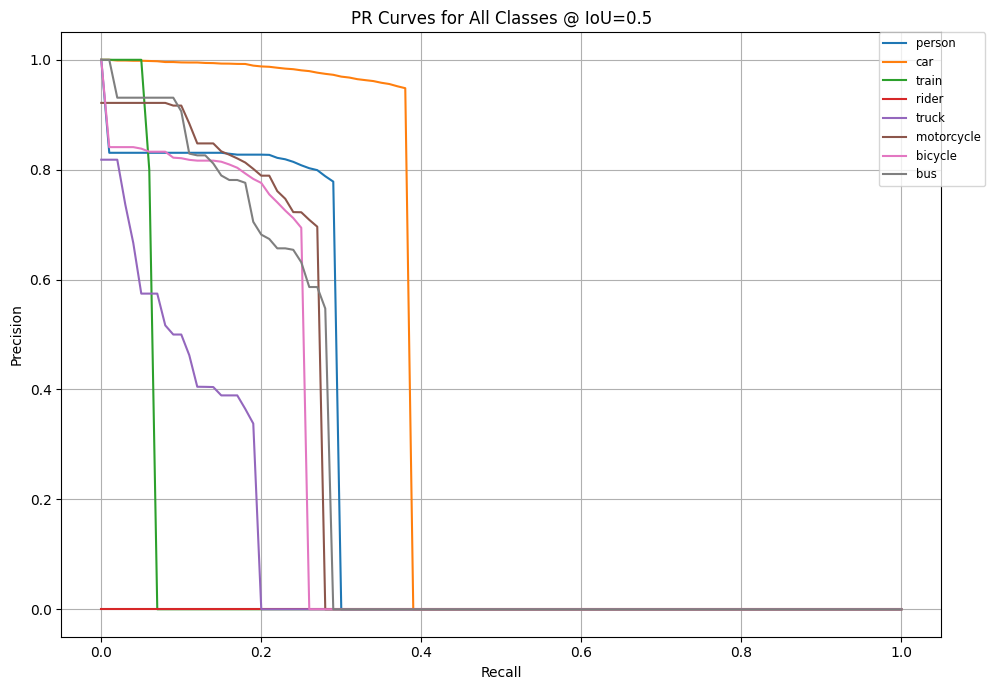

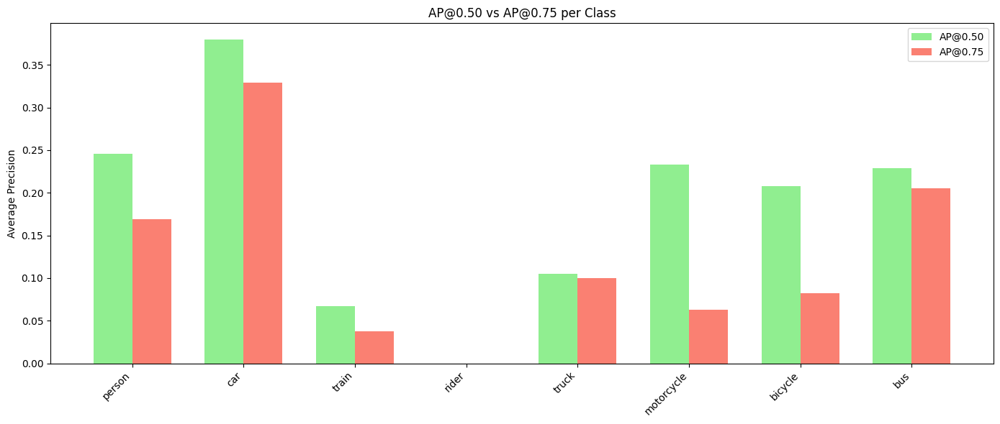

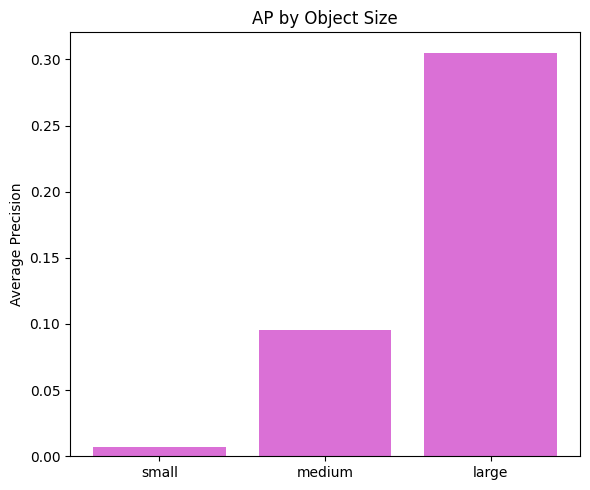

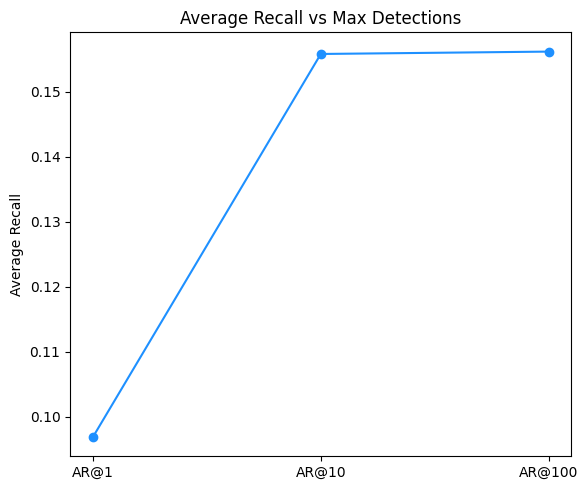


### Overall PR Curves at Multiple IoU Thresholds ###


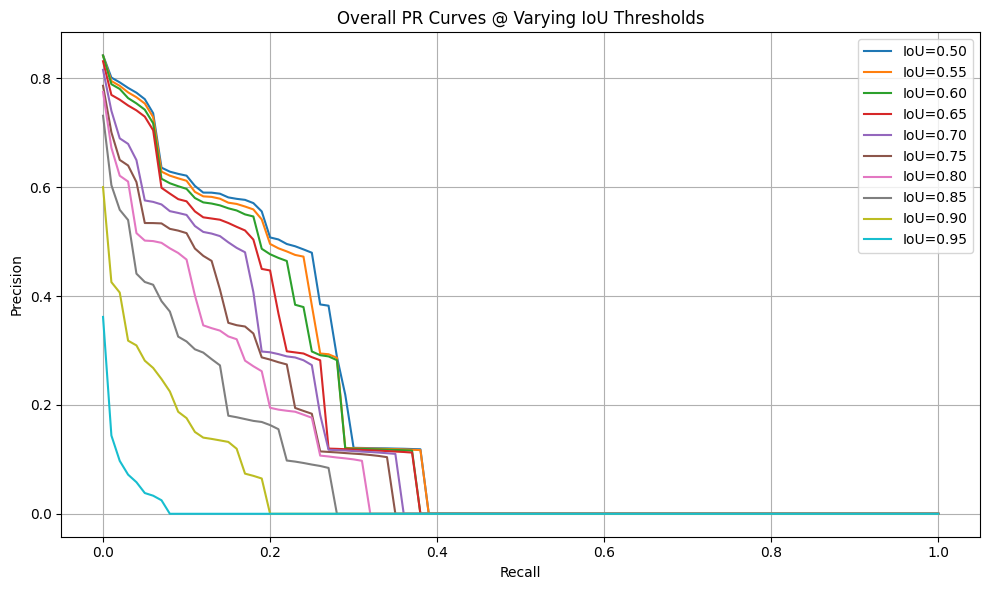

In [12]:
train_coco_pred = train_coco_gt.loadRes(train_save_path)
summarise_and_plot_metrics(train_coco_gt, train_coco_pred, "train_metrics")


--- Evaluating on validation set ---


Running inference:   0%|          | 0/76 [00:00<?, ?it/s]

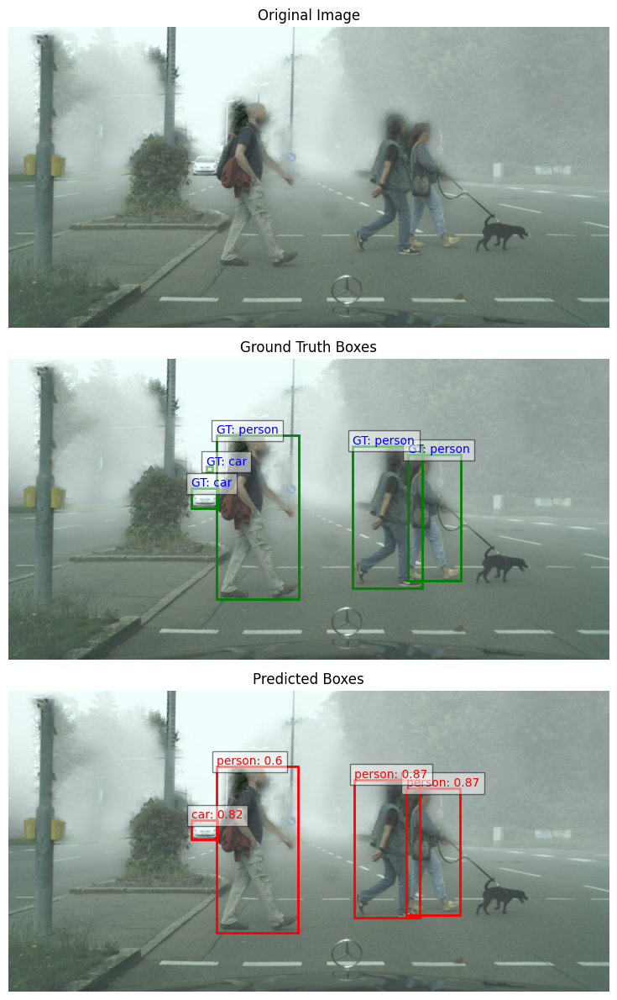

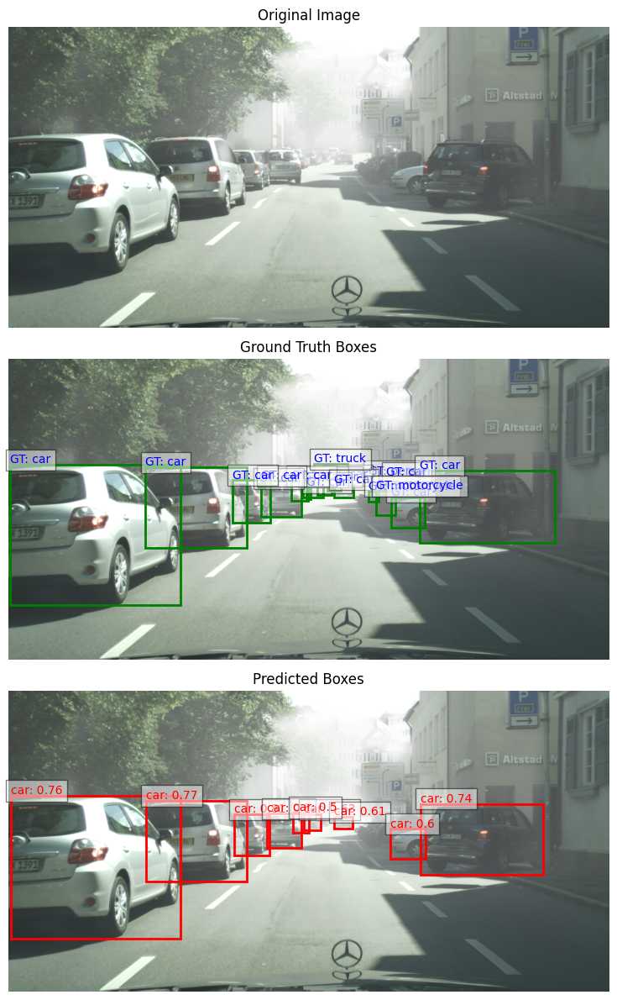

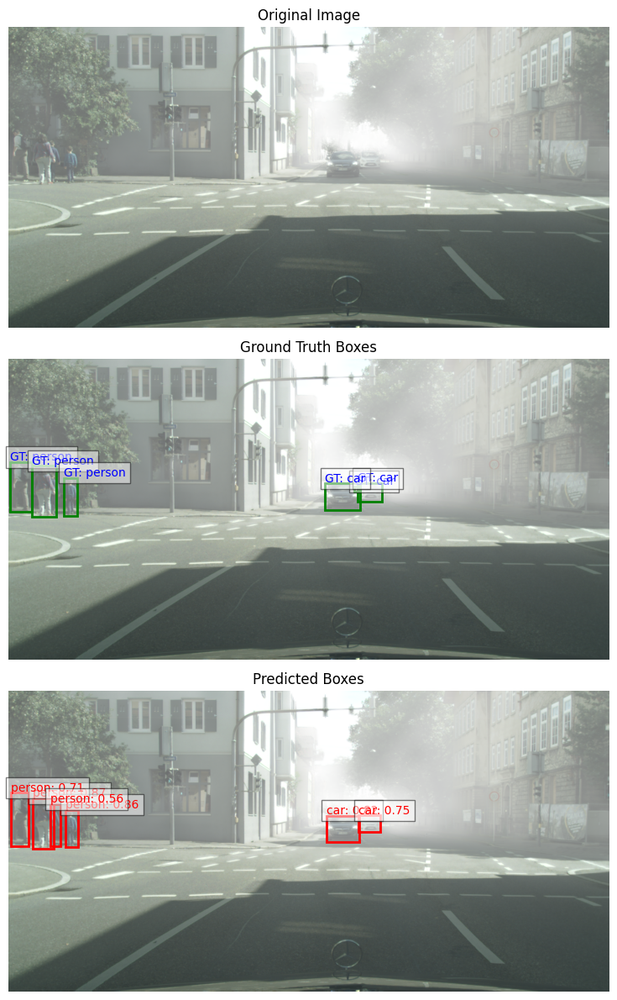

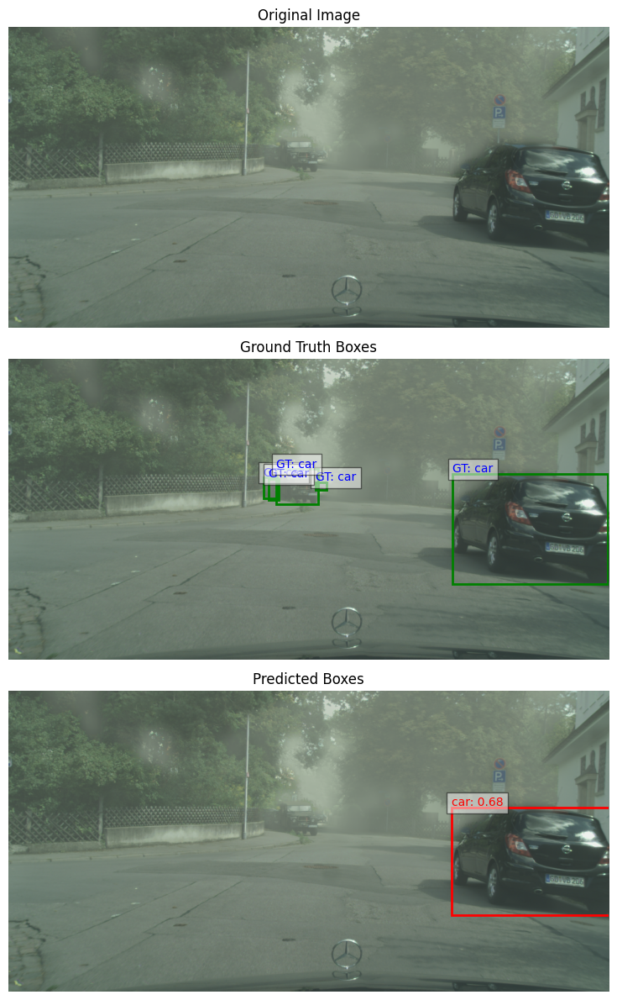

Running inference: 100%|██████████| 76/76 [03:20<00:00,  2.64s/it]


In [13]:
print("\n--- Evaluating on validation set ---")
val_save_path = "val_predictions.json"
model.eval()
with torch.no_grad():
    val_eval = inference(model, val_loader, processor, id_to_cat, val_save_path)

Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.25s).
Accumulating evaluation results...
DONE (t=0.15s).

### COCO Evaluation Summary ###
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.126
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.194
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.137
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.104
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.323
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.096
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.160
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.161
 Average Recall     (AR) @[ IoU=0.5

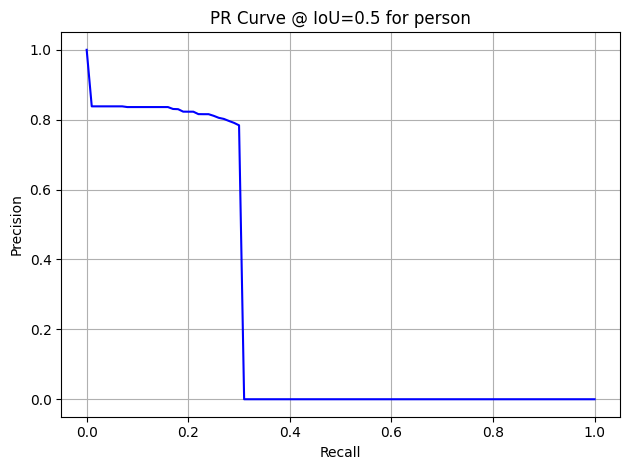

car                  | AP@0.5: 0.398 | AP@0.75: 0.348 | mAP@[.5:.95]: 0.304


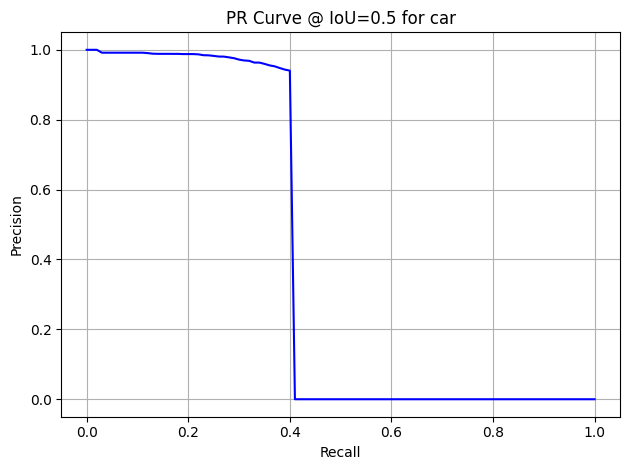

train                | AP@0.5: 0.000 | AP@0.75: 0.000 | mAP@[.5:.95]: 0.000


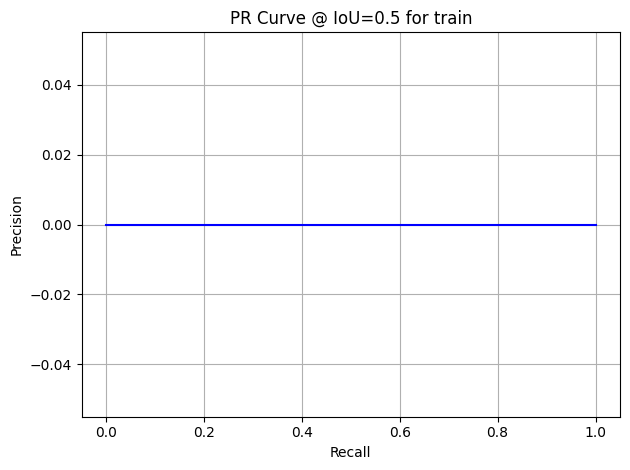

rider                | AP@0.5: 0.000 | AP@0.75: 0.000 | mAP@[.5:.95]: 0.000


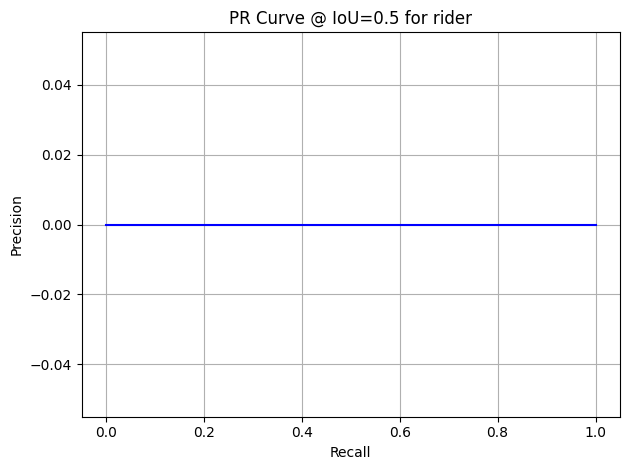

truck                | AP@0.5: 0.138 | AP@0.75: 0.119 | mAP@[.5:.95]: 0.110


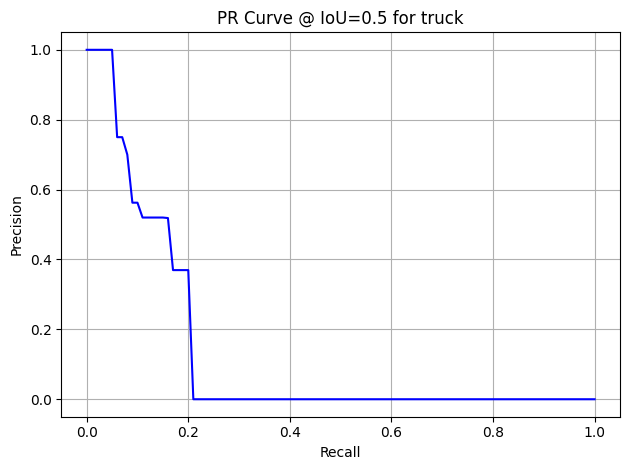

motorcycle           | AP@0.5: 0.307 | AP@0.75: 0.145 | mAP@[.5:.95]: 0.146


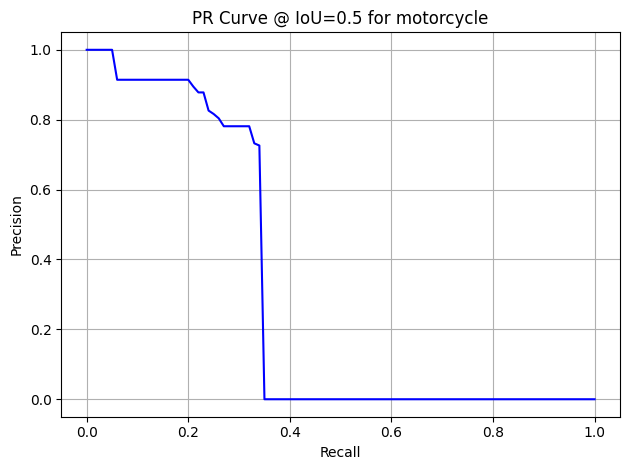

bicycle              | AP@0.5: 0.214 | AP@0.75: 0.080 | mAP@[.5:.95]: 0.101


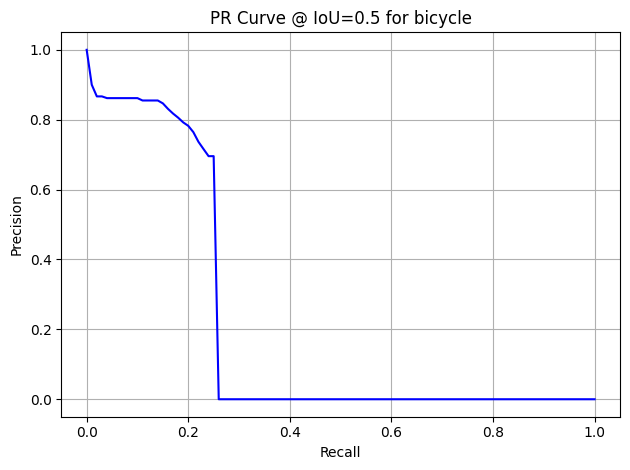

bus                  | AP@0.5: 0.240 | AP@0.75: 0.226 | mAP@[.5:.95]: 0.186


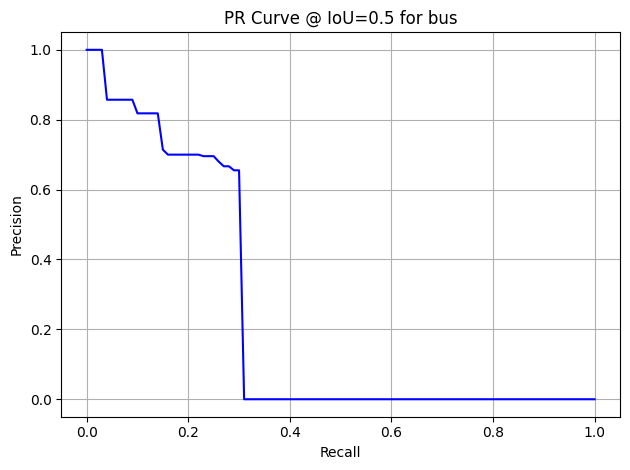

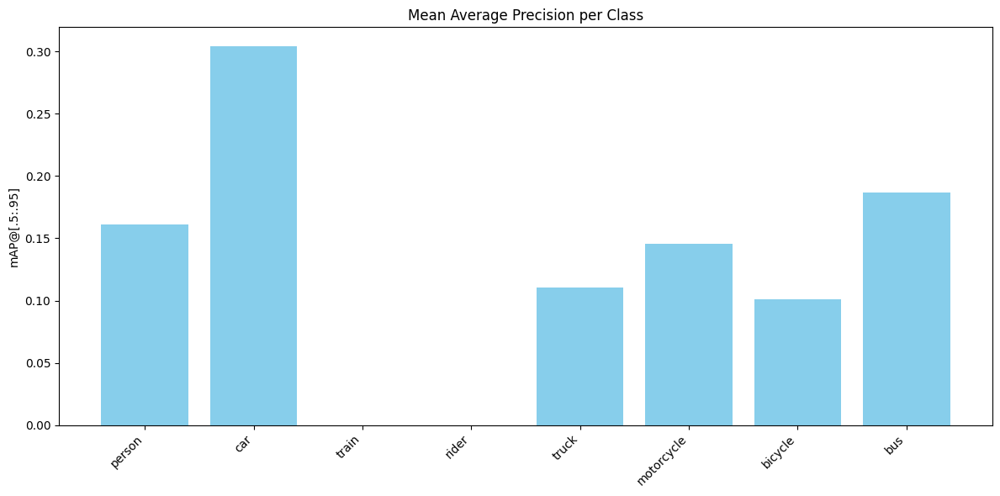

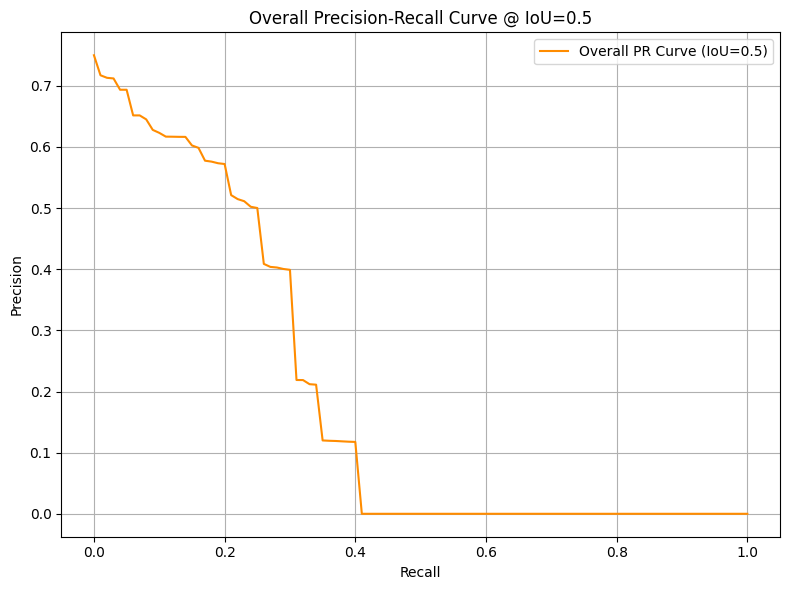

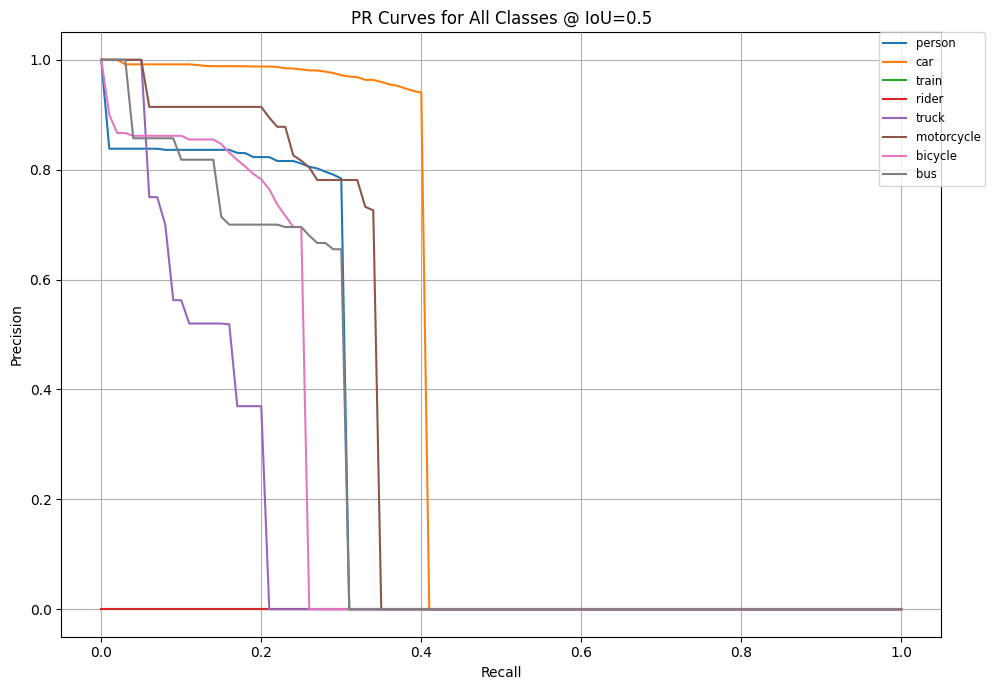

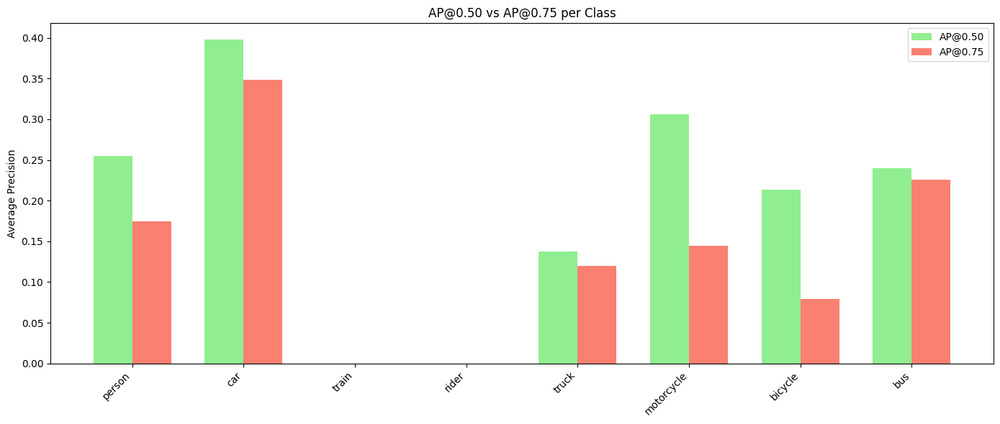

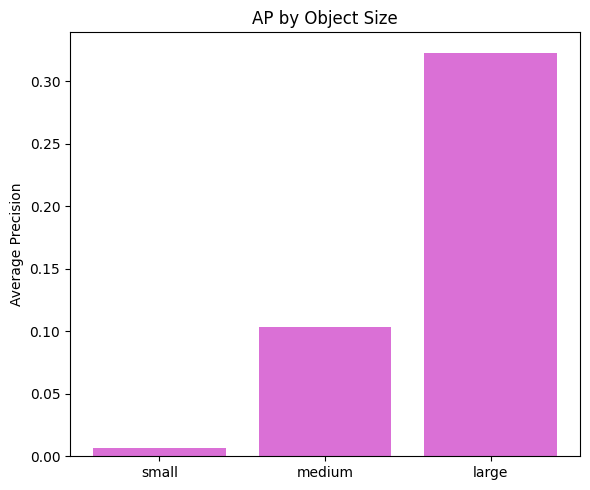

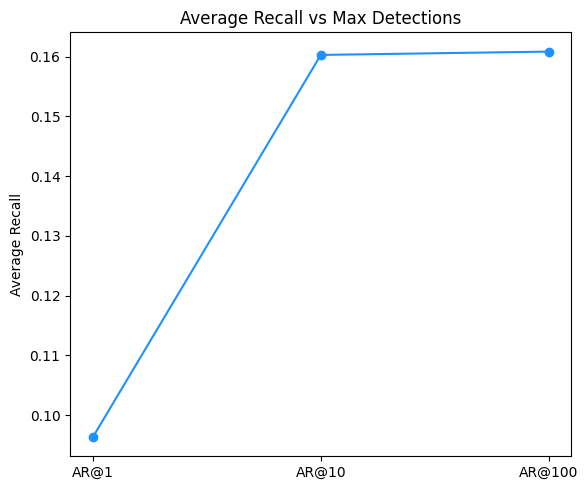


### Overall PR Curves at Multiple IoU Thresholds ###


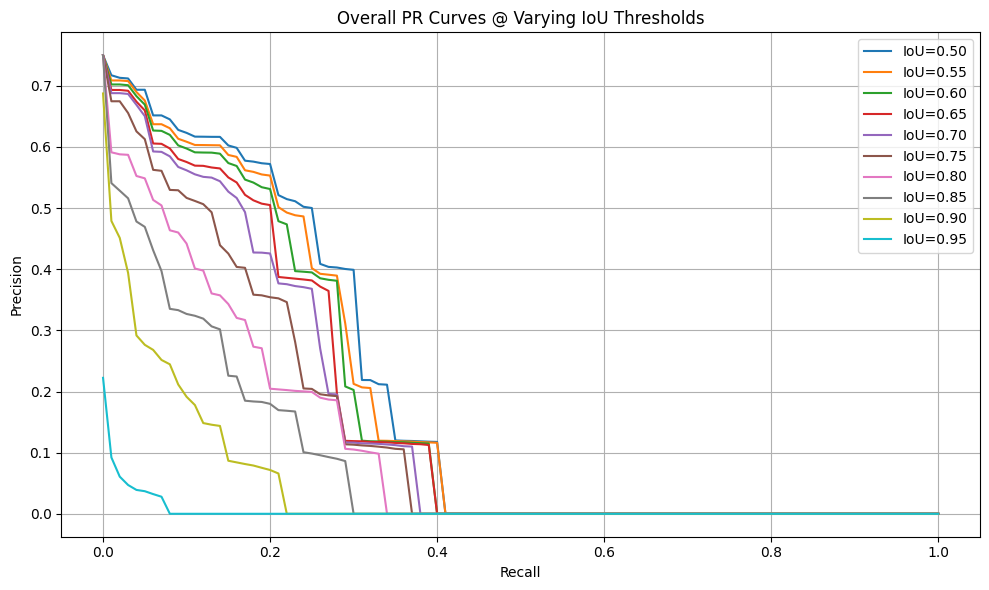

In [14]:
val_coco_pred = val_coco_gt.loadRes(val_save_path)
summarise_and_plot_metrics(val_coco_gt, val_coco_pred, "val_metrics")

In [15]:
print(model)

DeformableDetrForObjectDetection(
  (model): DeformableDetrModel(
    (backbone): DeformableDetrConvModel(
      (conv_encoder): DeformableDetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DeformableDetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DeformableDetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DeformableDetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3):